# Atmospheric variability
The ERA5 reanalysis dataset provides information about the atmosphere that can help contextualize sea ice conditions. Here, we'll plot 2 meter temperature and downwelling longwave radiation from ERA5 to get a sense for the atmospheric conditions during each winter season. 

In [11]:
import xarray as xr # For working with gridded climate data 
from utils.read_data_utils import read_book_data # Helper function for reading the data from the bucket
from utils.plotting_utils import static_winter_comparison_lineplot, staticArcticMaps, interactiveArcticMaps, compute_gridcell_winter_means # Plotting utils 

# Plotting dependencies
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150 # Sets figure size in the notebook

# Remove warnings to improve display
import warnings 
warnings.filterwarnings('ignore') 

# Read in the data 

In [16]:
book_ds = read_book_data() # Read/download the data 
book_ds = book_ds.where(book_ds.region_mask.isin([1,2,3,4,5,6])) # Restrict to the inner arctic 
years = [2018,2019,2020] # Years over which to perform analysis
save_label='Inner_Arctic_MYI'

# Uncomment out to set an additional ice type mask too and change the save_label accordingly (0 = FYI, 1 = MYI)
book_ds = book_ds.where(book_ds.ice_type==1)




# Map monthly data 
Here, we'll use the `interactiveArcticMaps` function to display the data. You can change the variable to display by changing `data_var` in the code cell below if you run the notebook in Binder.

In [17]:
data_var = "t2m"
interactiveArcticMaps(book_ds[data_var], cmap="coolwarm", frame_width=500)

:HoloMap   [time]
   :Overlay
      .Coastline.I :Feature   [Longitude,Latitude]
      .QuadMesh.I  :QuadMesh   [longitude,latitude]   (t2m)

# Map and plot the winter means
Below, we'll compute gridcell means for each month for each variable. Then, we'll plot the means on a map of the Arctic, and display them next to each other for easy visual comparison. 

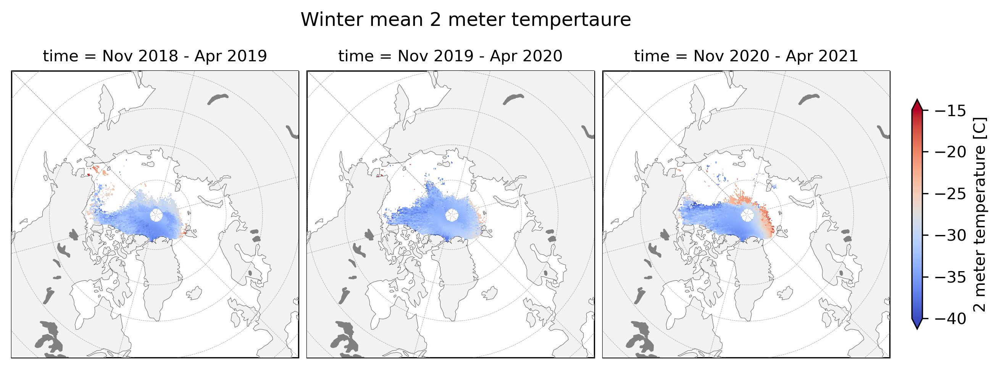

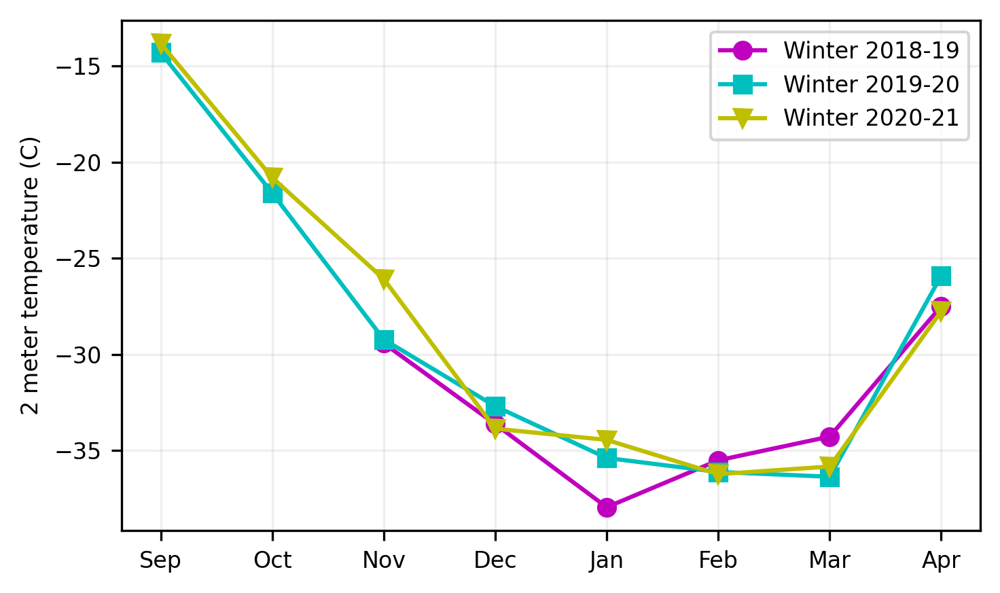

In [18]:
# Maps of the means 
t2m_winter_means = compute_gridcell_winter_means(book_ds.t2m, years=years)
pl = staticArcticMaps(t2m_winter_means, title="Winter mean 2 meter tempertaure", cmap="coolwarm", vmin=-40, vmax=-15)
display(pl)

# Mean monthly lineplot
static_winter_comparison_lineplot(book_ds.t2m, years=years,  figsize=(5,3), save_label=save_label, legend=True)

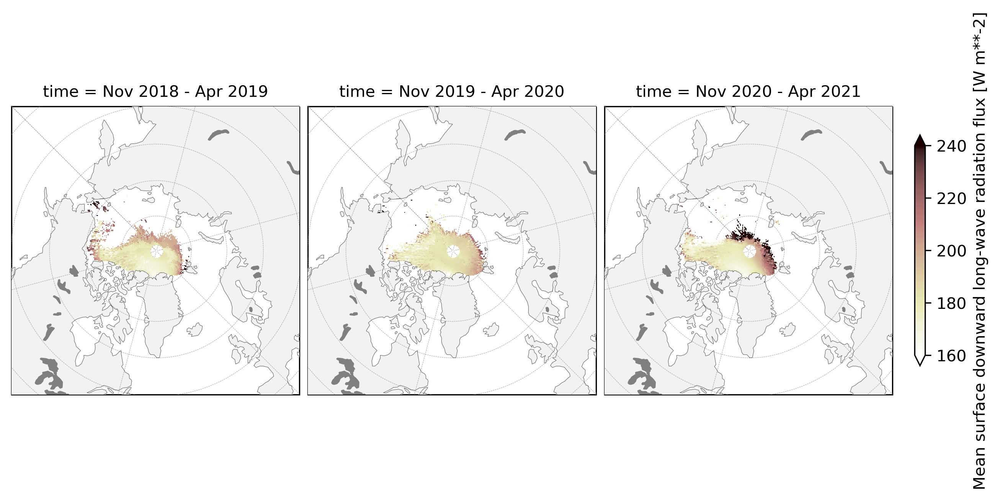

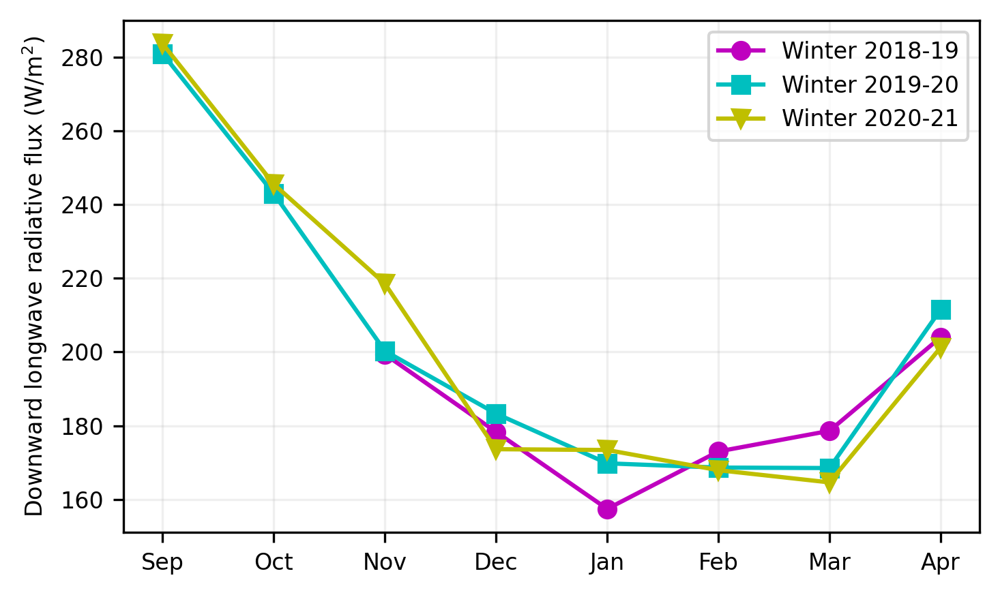

In [19]:
# Maps of the means 
msdwlwrf_winter_means = compute_gridcell_winter_means(book_ds.msdwlwrf, years=years)
pl = staticArcticMaps(msdwlwrf_winter_means, cmap="pink_r", vmin=160, vmax=240)
display(pl)

# Mean monthly lineplot
static_winter_comparison_lineplot(book_ds.msdwlwrf, years=years, figsize=(5,3), set_ylabel=r'Downward longwave radiative flux (W/m$^2$)', save_label=save_label, legend=True)